In [39]:
import numpy as np
import pandas as pd, datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import pandas_profiling as pp
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go

In [40]:
clustering = pd.read_csv("/Users/hato/Documents/GitHub/Datacracy_scala_hackathon/data/clustering_processed.csv", sep = ",")
listening = pd.read_csv("/Users/hato/Documents/GitHub/Datacracy_scala_hackathon/data/listening_processed.csv", sep = ",")
order = pd.read_csv("/Users/hato/Documents/GitHub/Datacracy_scala_hackathon/data/order_processed.csv", sep = ",")
user = pd.read_csv("/Users/hato/Documents/GitHub/Datacracy_scala_hackathon/data/user_processed.csv", sep = ",")


In [41]:
order = order.rename(columns = {"OrderID (PK)": "orderID", "Transaction Date" : "transaction_date","UserID (FK)" : "userID", "Bill Type": "bill_type", "Total Amount": "total_amount" })
clustering = clustering.rename(columns = {"User_ID (FK)": "userID", "Type_user": "type_user", "MainCluster_ID" : "main_cluseringID", "MainCluster_Description" : "main_clustering_description"})
listening = listening.rename(columns = {"PlaylistID (PK)": "playlistID", "Playlist Name":"playlist_name", "Category":"cat", "Sub Category" :"sub_cat", "Playlist Type" :"palylist_type","Playlist Duration (min)": "playlist_duration","Actual Duration (min)":"actual_duation","UserID (FK)":"userID", "Listening Time":"listening_time", "Listening Date" :"listening_date", "Listening Datetime":"listening_datetime"})
user = user.rename(columns = {"UserID (PK)":"userID", "VIP hay Free":"user_type", "Gender":"gender", "Year of Birth":"year_of_birth","Age Range": "age_range", "Age":"age", "Region": "region","Operation Systems":"operation_system","Registration Date":"registration_date", "Total Listerning":"total_listening", "Total Listening Time (Min)":"total_listening_time",   })

In [42]:
# change date by weekly
def adding_by_week(df, date_field):
    df['by_week'] = df.apply(lambda row: row[date_field] - dt.timedelta(days=row[date_field].weekday()), axis=1)
    df = df['by_week'].groupby(df['by_week']).count()

In [43]:
# xu li datetime
order.transaction_date = pd.to_datetime(order['transaction_date'], format='%Y-%m-%d')
user.registration_date = pd.to_datetime(user['registration_date'], format='%Y-%m-%d')
listening.listening_datetime = pd.to_datetime(listening['listening_datetime'], format='%Y-%m-%d')

# them truong datetime
adding_by_week(order, "transaction_date")
adding_by_week(user, "registration_date")
adding_by_week(listening, "listening_datetime")

## add some features related to time of the listening Table

listening['hour_listening'] = listening.listening_datetime.dt.hour
listening['dayofweek'] = listening['listening_datetime'].dt.dayofweek

listening["timepoint_of_the_day"] = listening.hour_listening.apply(lambda x : 
                                                             "late night" if x < 4 else
                                                             "early morning" if x < 7 else
                                                             "morning" if x < 11 else
                                                             "early afternoon" if x < 16 else
                                                             "afternoon" if x < 18 else
                                                             "evening"
                                                            )

listening['dayofweek'] =listening.dayofweek.apply(lambda x :  "Mon" if x == 0 else
                                                             "Tue" if x ==1 else
                                                             "Wed" if x ==2 else
                                                             "Thu" if x == 3 else
                                                             "Fri" if x == 4 else
                                                             "Sat" if x == 5 else
                                                             "Sun" 
                                                            )

listening['Workingday'] = listening["dayofweek"].apply(lambda x : 0 if x == 'Sun' or x == 'Sat' else 1)


In [44]:
# group tabe of order
order_group = order.groupby(["userID"]).agg({"orderID":'count', "total_amount":'sum'})
#add variable high_value user
order_group["high_value"] = order_group.total_amount.apply(lambda x: 1 if x > 199000 else 0 )
#merge to clustering table
order_df = pd.merge(order_group,clustering,how="left", on = ["userID", "userID"])

In [45]:
order_df.head()


,userID,orderID,total_amount,high_value,type_user,main_cluseringID,main_clustering_description
0,40843,3,27000,0,paid,5,New Paid Users
1,40861,1,199000,0,paid,3,Lost Users
2,41003,1,599000,1,paid,7,Loyal Users
3,41014,2,398000,1,paid,5,New Paid Users
4,41057,1,599000,1,paid,7,Loyal Users


In [46]:
order_summary = order_df.loc[order_df['high_value'] == 1].groupby(["main_clustering_description"]).agg({"total_amount":'sum',"high_value":"sum"})
# order_summary["percent"] = order_summary["high_value"].apply(lambda x: float(x.sum())/ float(total_order) *100)
# order_summary.head()
order_summary["percent_high_value_user"] = (order_summary["high_value"]/ order_df["high_value"].count()*100)
order_summary["percent_revenue_of_high_value_user"] = (order_summary["total_amount"]/ order_df["total_amount"].sum()*100)
order_summary.head()

,total_amount,high_value,percent_high_value_user,percent_revenue_of_high_value_user
main_clustering_description,,,,
Churn App Users,41475000,86,3.260045,5.789452
Lost High-value,70042000,119,4.510993,9.777090
Lost Users,11966000,45,1.705838,1.670322
Loyal Users,243292000,447,16.944655,33.960879
New Paid Users,115136000,200,7.581501,16.071715


In [47]:
# merge order vs user data vs clustering data
listening_link = pd.merge(listening,clustering,how="left", on = ["userID", "userID"])
listening_link.drop(["Unnamed: 11", "listening_datetime"], axis =1)

,playlistID,playlist_name,cat,sub_cat,palylist_type,playlist_duration,actual_duation,userID,listening_time,listening_date,by_week,hour_listening,dayofweek,timepoint_of_the_day,Workingday,type_user,main_cluseringID,main_clustering_description
0,4529,Dạy Tiếng Anh Cho Trẻ Mầm Non,Podcast,Học ngoại ngữ,free,44.9,0.1,82846,06:05:00,03-12-2020,2020-11-30 06:05:00,6,Thu,early morning,1,free,8,"Potential, Engaging Listeners"
1,4577,Tư Duy Tích Cực - Bạn Là Những Gì Bạn Nghĩ (Nh...,Sách nói,Hạnh phúc,vip,79.8,15.9,56112,12:49:00,30-10-2020,2020-10-26 12:49:00,12,Fri,early afternoon,1,free,6,"New Users, Engaging Listeners"
2,4169,50 thiên thần của bạn: Giải phóng bản thân khỏ...,Sách nói,Tâm linh,vip,324.8,6.8,94362,00:17:00,15-12-2020,2020-12-14 00:17:00,0,Tue,late night,1,free,10,"Loyal Users, Engaging Listeners"
3,4581,[Sách Tóm Tắt] Đọc Vị Bất Kỳ Ai,Sách tóm tắt,Sách tóm tắt,free,24.8,2.1,85469,23:09:00,29-11-2020,2020-11-23 23:09:00,23,Sun,evening,0,free,6,"New Users, Engaging Listeners"
4,4577,Tư Duy Tích Cực - Bạn Là Những Gì Bạn Nghĩ (Nh...,Sách nói,Hạnh phúc,vip,79.8,19.0,70171,21:09:00,06-12-2020,2020-11-30 21:09:00,21,Sun,evening,0,paid,6,Potential Users
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
750093,3838,[Sách Tóm Tắt] 7 Lý Do Tiềm Ẩn Khiến Nhân Viên...,Sách tóm tắt,Sách tóm tắt,vip,31.1,0.3,107068,18:08:00,31-12-2020,2020-12-28 18:08:00,18,Thu,evening,1,free,7,"Potential, Skimming Listeners"
750094,4832,Bí Mật Tư Duy Triệu Phú,Sách nói,Thành công,coin,378.4,45.3,58268,17:00:00,03-10-2020,2020-09-28 17:00:00,17,Sat,afternoon,0,free,3,Need Attention
750095,4347,Sống Xanh - Kẻ Trộm Băng,Thiếu nhi,Thiếu nhi,free,14.0,10.9,54318,17:31:00,15-09-2020,2020-09-14 17:31:00,17,Tue,afternoon,1,free,2,Defrost
750096,4949,Bí Mật Của Cảm Hứng Và Say Mê,Sách nói,Thành công,vip,214.0,7.6,73389,07:42:00,06-12-2020,2020-11-30 07:42:00,7,Sun,morning,0,free,6,"New Users, Engaging Listeners"


In [50]:
value_list = ["Loyal Users", "New Paid Users",'Potential Users']
# listening_group = listening_link.sub_cat.isin(value_list)
listening_group = listening_link.groupby(["timepoint_of_the_day", "sub_cat", "by_week"]).agg({"actual_duation":'sum', "userID":'count'}).reset_index()
listening_group["average"] = listening_group["actual_duation"]/listening_group["userID"]
listening_group.to_csv("/Users/hato/Documents/GitHub/Datacracy_scala_hackathon/data/listening_group.csv", index=False)

# a = listening_group[listening_group["sub_cat"] == "Tâm linh"]

# b = listening_link[listening_link["sub_cat"] == "Tâm linh"]
# b_1 = b.groupby(["by_week"]).agg({"actual_duation":'sum', "userID":'count'}).reset_index()
# listening_group_1 = listening_link.groupby(["by_week", "sub_cat"]).agg({"actual_duation":'sum', "userID":'count'}).reset_index()
# b = listening_group_1[listening_group_1["sub_cat"] == "Tâm linh"]

In [51]:
fig = px.bar(listening_group, x="sub_cat", y="actual_duration", color = "timepoint_of_the_day", title="Long-Form Input")
fig.show()

fig = px.pie(listening_group, values='actual_duation', names='timepoint_of_the_day', title='Population of European continent')
fig.show()

fig = px.pie(listening_group, values='userID', names='timepoint_of_the_day', title='Population of European continent')
fig.show()

# fig = go.Figure([go.Scatter(x=b['by_week'], y=b['actual_duation'])])
fig = px.line(listening_group, x="by_week", y="actual_duation", title='Life expectancy in Canada')
fig.show()

# fig, ax = plt.subplots(figsize=(8, 6))
# ax.plot(b_1["by_week"], b_1["actual_duation"])

In [ ]:
#feature type
categorical_feature = order_df.select_dtypes(exclude = np.number)
numeric_feature = order_df.select_dtypes(include = np.number)

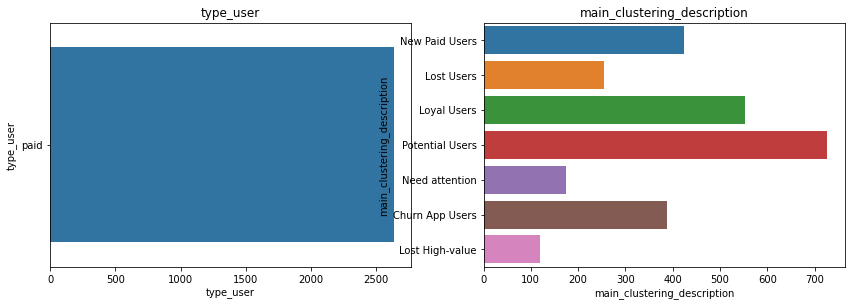

In [ ]:
# xac dinh
#check count based on categorical features
plt.figure(figsize=(22,80), facecolor='white')
plotnumber =1
for i in categorical_feature:
    ax = plt.subplot(15,3,plotnumber)
    sns.countplot(y=i, data=order_df)
    plt.xlabel(i)
    plt.title(i)
    plotnumber+=1 
plt.show()

In [ ]:
# xac dinh high value cua paid user
order1 = order[["transaction_date", "userID", "total_amount"]].copy()
order_new = order1.resample('W', on="transaction_date")
order1.resample('W-Mon', on='transaction_date').sum().reset_index().sort_values(by='transaction_date')

,transaction_date,userID,total_amount
0,2020-07-13,41655,276000
1,2020-07-20,207541,1761000
2,2020-07-27,462235,2749000
3,2020-08-03,85079,435000
4,2020-08-10,644400,3339000
5,2020-08-17,1723265,5846000
6,2020-08-24,8808431,21903000
7,2020-08-31,8011377,29855000
8,2020-09-07,8470674,37896000
9,2020-09-14,8776803,30809000


In [ ]:
a.groupby('userID').head()

,timepoint_of_the_day,sub_cat,by_week,actual_duation,userID,average
0,afternoon,Con cái,2020-06-29 16:06:00,0.3,1,0.300000
1,afternoon,Con cái,2020-07-06 17:22:00,1.2,1,1.200000
2,afternoon,Con cái,2020-07-13 16:01:00,0.0,1,0.000000
3,afternoon,Con cái,2020-07-13 16:05:00,0.3,1,0.300000
4,afternoon,Con cái,2020-07-13 16:35:00,1.3,1,1.300000
...,...,...,...,...,...,...
19173,afternoon,Thành công,2020-12-14 17:35:00,145.6,18,8.088889
19296,afternoon,Thành công,2020-12-21 17:40:00,230.7,24,9.612500
22345,afternoon,Tâm linh,2020-12-07 17:34:00,526.1,19,27.689474
23601,afternoon,Văn hoá,2020-09-21 17:26:00,397.0,58,6.844828


In [ ]:
a = order.groupby('userID').resample('W%', on='transaction_date').sum().reset_index().sort_values(by='transaction_date')

ValueError: Invalid frequency: W%